In [1]:
import pandas as pd
import numpy as np
rating_data = pd.read_csv('data/train_ratings.csv')

In [2]:
rating_data.describe()

,user_id,movie_id,rating,timestamp
count,800167.000000,800167.000000,800167.000000,8.001670e+05
mean,3024.429403,1865.623762,3.581490,9.722470e+08
std,1728.104442,1096.269149,1.117253,1.215774e+07
min,1.000000,1.000000,1.000000,9.567039e+08
25%,1506.000000,1029.000000,3.000000,9.653029e+08
50%,3069.000000,1835.000000,4.000000,9.730218e+08
75%,4476.000000,2770.000000,4.000000,9.752206e+08
max,6040.000000,3952.000000,5.000000,1.046455e+09


In [3]:
rating_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800167 entries, 0 to 800166
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype
---  ------     --------------   -----
 0   user_id    800167 non-null  int64
 1   movie_id   800167 non-null  int64
 2   rating     800167 non-null  int64
 3   timestamp  800167 non-null  int64
dtypes: int64(4)
memory usage: 24.4 MB


In [4]:
value_counts =rating_data['user_id'].value_counts().sort_index().to_frame()
value_counts.describe()

,count
count,6040.000000
mean,132.477980
std,154.162074
min,10.000000
25%,35.000000
50%,76.000000
75%,167.000000
max,1858.000000


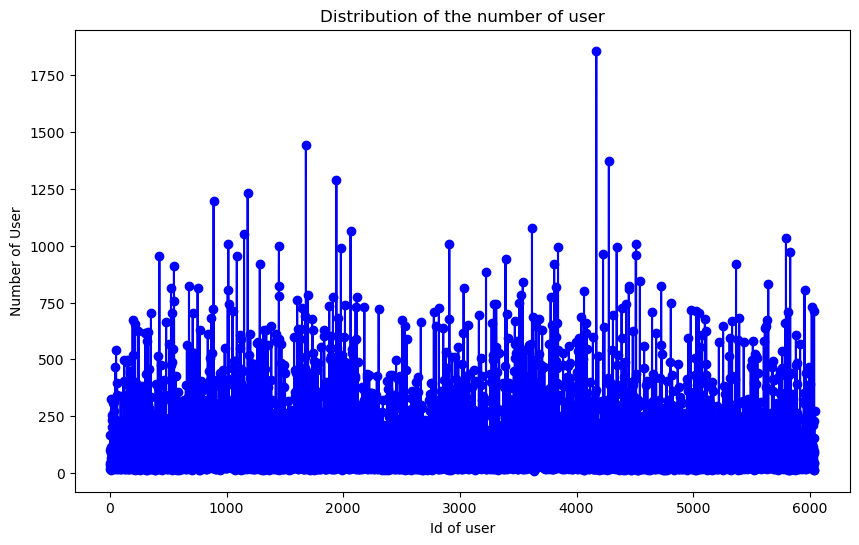

In [5]:
# draw the distribution of the number of user
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.plot(np.array(value_counts.index), value_counts['count'].values, marker='o', linestyle='-', color='b')
plt.title('Distribution of the number of user')
plt.xlabel('Id of user')
plt.ylabel('Number of User')
plt.show()


In [6]:
# calculate the lack of movieId for each user
# firstly, we construct a dictionary to store the movieId for each user
from collections import defaultdict
movie_dict = defaultdict(list)
for index, row in rating_data.iterrows():
    user_id = row['user_id']
    movie_id = row['movie_id']
    movie_dict[user_id].append(movie_id)

# get the missing movieId for each user

In [7]:
# Persist files to disk for quick reading next time
import pickle
with open('movie_dict.pkl', 'wb') as f:
    pickle.dump(movie_dict, f)
del movie_dict

In [8]:
movie_ids = set(rating_data['movie_id'].unique())
len(movie_ids)

3675

In [9]:
# calculate the number of missing movieId for each user
missing_movie_id = {}
with open('movie_dict.pkl', 'rb') as f:
    movie_dict = pickle.load(f)
for user_id, movie_list in movie_dict.items():
    user_movie_set = set(movie_list)
    missing_movie_id[user_id] = list(movie_ids - user_movie_set)

# store the missing_movie_id to disk
with open('missing_movie_id.pkl', 'wb') as f:
    pickle.dump(missing_movie_id, f)


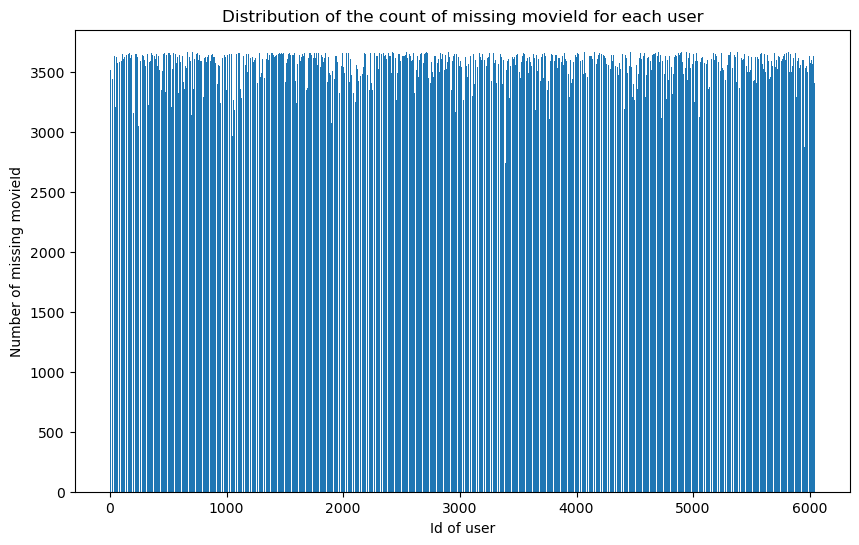

In [10]:
# analysis the missing movieId for each user
# draw the distribution of the number of missing movieId for each user
missing_movie_id_count = {}
for user_id, movie_list in missing_movie_id.items():
    missing_movie_id_count[user_id] = len(movie_list)
sorted_missing_movie_id_count = dict(sorted(missing_movie_id_count.items(), key=lambda x: x[0]))
plt.figure(figsize=(10, 6))
plt.bar(list(sorted_missing_movie_id_count.keys()), list(sorted_missing_movie_id_count.values()))
plt.title('Distribution of the count of missing movieId for each user')
plt.xlabel('Id of user')
plt.ylabel('Number of missing movieId')
plt.show()



In [11]:
# del missing_movie_id
# del movie_dict
# del sorted_missing_movie_id_count


In [12]:
# query the recent movie for each user
movie_dict = pd.read_csv('data/train_ratings.csv')
movie_dict_user = movie_dict.sort_values(by=['user_id', 'timestamp'], ascending=[True, False])
# get the top 5 movie for each user
movie_dict_user_top5 = movie_dict_user.groupby('user_id').head(20)

movie_dict_user_top5.to_csv('movie_dict_user_top20.csv', index=False)

In [13]:
rating_data

,user_id,movie_id,rating,timestamp
0,5412,2683,2,960243649
1,5440,904,5,959995181
2,368,3717,4,976311423
3,425,1721,4,976283587
4,4942,3697,1,962642480
...,...,...,...,...
800162,398,3081,4,1044565753
800163,669,70,2,975633579
800164,3685,2108,4,967121561
800165,3312,3616,4,983252174


In [14]:

rating_matrix = rating_data.pivot_table(values='rating',index='user_id',columns=
                                        'movie_id')
rating_matrix

movie_id,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
user_id,,,,,,,,,,,,,,,,,,,,,
1,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6036,NaN,NaN,NaN,2.0,NaN,3.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6037,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6038,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
rating_matrix[1].dropna()

user_id
1       5.0
8       4.0
9       5.0
18      4.0
19      5.0
       ... 
6022    5.0
6025    5.0
6032    4.0
6035    4.0
6040    3.0
Name: 1, Length: 1693, dtype: float64

In [16]:
def cosine_similarity(matrix):
    # Normalize the rating matrix
    norm_matrix = matrix.sub(matrix.mean(axis=1), axis=0).fillna(0)
    dot_product = np.dot(norm_matrix, norm_matrix.T)
    norm = np.linalg.norm(norm_matrix, axis=1)
    similarity = dot_product / np.outer(norm, norm)
    np.fill_diagonal(similarity, 0)  # Fill diagonal with zeros to exclude self-similarity
    return pd.DataFrame(similarity, index=matrix.index, columns=matrix.index)

user_similarity = cosine_similarity(rating_matrix)
user_similarity

/var/folders/tt/pf5xh4vs14v9h68lqh4py2s00000gn/T/ipykernel_53211/3261904391.py:6: RuntimeWarning: invalid value encountered in divide
  similarity = dot_product / np.outer(norm, norm)


user_id,1,2,3,4,5,6,7,8,9,10,...,6031,6032,6033,6034,6035,6036,6037,6038,6039,6040
user_id,,,,,,,,,,,,,,,,,,,,,
1,0.000000,0.043744,-0.012663,0.025423,-0.015363,-0.014262,0.021082,0.015885,0.110794,0.025970,...,-0.014423,0.011352,0.035935,0.003207,0.076923,-0.008044,-0.008726,0.000000,0.048644,0.005908
2,0.043744,0.000000,0.024736,-0.020707,-0.004797,-0.015652,0.091208,-0.017063,0.073396,-0.036306,...,-0.013472,0.020239,-0.004569,0.000000,0.065101,0.070933,0.061838,0.015344,0.035695,-0.020947
3,-0.012663,0.024736,0.000000,0.040803,-0.016591,0.001251,0.052652,-0.061585,-0.038694,-0.018285,...,0.000737,-0.007302,-0.016350,0.000000,0.002590,0.036340,-0.009103,0.000000,0.045094,-0.045820
4,0.025423,-0.020707,0.040803,0.000000,-0.017175,0.032216,0.041910,0.018973,0.026391,-0.044947,...,-0.030217,0.001902,0.051511,0.000000,-0.049973,0.027736,0.020628,-0.027157,-0.036191,0.034454
5,-0.015363,-0.004797,-0.016591,-0.017175,0.000000,-0.050082,0.055303,0.055632,-0.014337,0.008004,...,0.011552,0.016395,-0.003478,0.022396,0.062275,0.030528,-0.024821,0.002233,0.020243,0.077457
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6036,-0.008044,0.070933,0.036340,0.027736,0.030528,-0.044748,0.036211,0.044962,-0.008173,0.002948,...,-0.004808,0.033003,0.024945,0.058386,0.079117,0.000000,0.030707,-0.028015,0.021710,0.071666
6037,-0.008726,0.061838,-0.009103,0.020628,-0.024821,0.016545,-0.080063,-0.039696,0.068503,0.005251,...,0.027312,0.061242,-0.001585,-0.023685,0.003376,0.030707,0.000000,-0.015839,0.036714,0.025126
6038,0.000000,0.015344,0.000000,-0.027157,0.002233,-0.017645,0.000000,0.001477,0.019887,0.025523,...,-0.068012,-0.013103,0.000000,0.000000,0.014137,-0.028015,-0.015839,0.000000,0.084413,-0.014445


In [26]:
def cosine_similarity(matrix):
    # Normalize the rating matrix
    matrix = matrix.T
    norm_matrix = matrix.sub(matrix.mean(axis=1), axis=0).fillna(0)
    dot_product = np.dot(norm_matrix, norm_matrix.T)
    norm = np.linalg.norm(norm_matrix, axis=1)
    similarity = dot_product / np.outer(norm, norm)
    np.fill_diagonal(similarity, 0)  # Fill diagonal with zeros to exclude self-similarity
    return pd.DataFrame(similarity, index=matrix.index, columns=matrix.index)

item_similarity = cosine_similarity(rating_matrix)
item_similarity

/var/folders/tt/pf5xh4vs14v9h68lqh4py2s00000gn/T/ipykernel_53211/486060253.py:7: RuntimeWarning: invalid value encountered in divide
  similarity = dot_product / np.outer(norm, norm)


movie_id,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
movie_id,,,,,,,,,,,,,,,,,,,,,
1,0.000000,0.041445,0.034275,0.065216,0.063693,0.009053,0.030620,0.024618,-0.013438,0.037378,...,0.000891,0.001337,0.014944,0.006228,0.028211,0.043750,0.032482,0.000935,0.007996,0.009663
2,0.041445,0.000000,0.029207,0.003782,0.072357,0.032772,0.061153,0.042559,0.061515,0.063371,...,-0.008790,0.000000,0.011421,0.018711,-0.006749,0.041228,-0.002845,-0.015166,-0.001527,0.007284
3,0.034275,0.029207,0.000000,0.036987,0.100415,0.038613,0.068507,0.038230,0.012266,0.064271,...,-0.009853,0.016176,-0.015649,0.023773,0.032558,0.052014,0.004582,0.007999,0.025890,-0.003743
4,0.065216,0.003782,0.036987,0.000000,0.105709,0.014614,0.013332,0.003002,-0.037750,-0.004498,...,0.014074,0.017447,0.011049,0.024895,0.000000,0.029141,-0.063037,-0.000614,-0.018426,0.017004
5,0.063693,0.072357,0.100415,0.105709,0.000000,0.033054,0.055080,0.017724,0.088417,0.038672,...,-0.016424,0.051184,0.009515,0.018759,0.040674,0.056244,-0.005135,0.001922,-0.000196,-0.009398
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3948,0.043750,0.041228,0.052014,0.029141,0.056244,0.020609,0.006023,0.010687,-0.012686,0.025646,...,-0.017244,0.011194,0.038884,0.021585,0.020716,0.000000,-0.019377,0.008517,-0.002416,0.007708
3949,0.032482,-0.002845,0.004582,-0.063037,-0.005135,0.013237,0.004826,-0.028248,0.000232,0.007334,...,0.039166,0.039497,-0.010116,-0.013274,-0.001747,-0.019377,0.000000,-0.005022,0.174824,0.061618
3950,0.000935,-0.015166,0.007999,-0.000614,0.001922,-0.028102,0.004811,0.071262,-0.009449,0.003412,...,-0.026687,0.052314,-0.068604,-0.125943,0.053865,0.008517,-0.005022,0.000000,0.043791,0.048059


In [37]:
non_na = rating_matrix.iloc[1].notna()
non_na_positions = non_na[non_na].index
non_na_positions

Index([  21,  110,  163,  165,  235,  265,  292,  318,  349,  356,
       ...
       3334, 3418, 3451, 3468, 3471, 3654, 3678, 3699, 3809, 3893],
      dtype='int64', name='movie_id', length=103)

In [114]:
user_ids = rating_matrix.index
user_ids

Index([   1,    2,    3,    4,    5,    6,    7,    8,    9,   10,
       ...
       6031, 6032, 6033, 6034, 6035, 6036, 6037, 6038, 6039, 6040],
      dtype='int64', name='user_id', length=6040)

In [42]:
## obtain the missing movieId for each user
with open('missing_movie_id.pkl', 'rb') as f:
    missing_movie_id = pickle.load(f)
    
missing_movie_id

{5412: [2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  26,
  27,
  28,
  29,
  30,
  31,
  33,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  67,
  69,
  71,
  72,
  73,
  74,
  75,
  76,
  77,
  78,
  79,
  80,
  81,
  82,
  83,
  84,
  85,
  86,
  87,
  88,
  89,
  90,
  92,
  93,
  94,
  95,
  96,
  97,
  98,
  99,
  100,
  101,
  102,
  103,
  104,
  105,
  106,
  107,
  108,
  111,
  113,
  114,
  116,
  117,
  118,
  119,
  120,
  121,
  122,
  123,
  124,
  125,
  126,
  127,
  128,
  129,
  130,
  131,
  132,
  133,
  134,
  135,
  136,
  137,
  138,
  140,
  141,
  142,
  144,
  145,
  146,
  147,
  148,
  149,
  152,
  153,
  154,
  155,
  156,
  157,
  158,
  159,
  160,
  161,
  162,
  163,
  164,
  165,
  166,
  167,
  168,
  169,
  170,
  171,
  173,
  174,


In [56]:
missing_movie_id[1]

[2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 110,
 111,
 112,
 113,
 114,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 140,
 141,
 142,
 144,
 145,
 146,
 147,
 148,
 149,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,
 185,
 186,
 187,
 188,
 189,
 190,
 191,
 192,
